In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot

In [2]:
import geopandas as gpd
from shapely import wkt
import osmnx as ox
import contextily as ctx
import shapely
import os
import optimiser as op

Set parameter Username
Academic license - for non-commercial use only - expires 2023-10-15
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (mac64[x86])
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 3485 rows, 9131 columns and 15649 nonzeros
Model fingerprint: 0xd3701346
Model has 4 general constraints
Variable types: 3489 continuous, 5642 integer (434 binary)
Coefficient statistics:
  Matrix range     [1e+00, 5e+04]
  Objective range  [1e+00, 1e+03]
  Bounds range     [1e+00, 1e+02]
  RHS range        [3e+00, 9e+04]
Presolve removed 3482 rows and 9126 columns
Presolve time: 0.05s
Presolved: 3 rows, 5 columns, 8 nonzeros
Variable types: 1 continuous, 4 integer (1 binary)
Found heuristic solution: objective 665514.58664
Found heuristic solution: objective 663014.58664
Found heuristic solution: objective 616014.58664

Root relaxation: objective 6.031571e+05, 2 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |

In [3]:
df =  pd.read_excel("./data/Demand_data.xlsx")
df['geometry']= df['geometry'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df,geometry='geometry',crs='EPSG:4326')
new_df = op.get_new_dataframe(df)

Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (mac64[x86])
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 3485 rows, 9131 columns and 15649 nonzeros
Model fingerprint: 0xd3701346
Model has 4 general constraints
Variable types: 3489 continuous, 5642 integer (434 binary)
Coefficient statistics:
  Matrix range     [1e+00, 5e+04]
  Objective range  [1e+00, 1e+03]
  Bounds range     [1e+00, 1e+02]
  RHS range        [3e+00, 9e+04]
Presolve removed 3482 rows and 9126 columns
Presolve time: 0.12s
Presolved: 3 rows, 5 columns, 8 nonzeros
Variable types: 1 continuous, 4 integer (1 binary)
Found heuristic solution: objective 665514.58664
Found heuristic solution: objective 663014.58664
Found heuristic solution: objective 616014.58664

Root relaxation: objective 6.031571e+05, 2 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    Best

In [4]:
df.columns

Index(['Ref', 'geometry', 'Number of Charging Points',
       'Number of Slow Charging Points', 'Number of Fast Charging Points',
       'Number of Rapid Charging Points', 'Number of PoI',
       'Number of Potential Locations', 'Distance from Centre', 'NEIGHBORS',
       'Demand_0', 'Demand_1', 'Demand_2', 'Demand_3', 'Supply_0', 'Diff_0',
       'Supply_1', 'Diff_1', 'Supply_2', 'Diff_2', 'Supply_3', 'Diff_3'],
      dtype='object')

In [5]:
gdf = gdf.to_crs('EPSG:27700')
gdf.head()
#4326

,Ref,geometry,Number of Charging Points,Number of Slow Charging Points,Number of Fast Charging Points,Number of Rapid Charging Points,Number of PoI,Number of Potential Locations,Distance from Centre,NEIGHBORS,...,Demand_2,Demand_3,Supply_0,Diff_0,Supply_1,Diff_1,Supply_2,Diff_2,Supply_3,Diff_3
0,1,"POLYGON ((331921.703 728414.044, 331921.703 72...",0,0,0,0,0,0,8403.561223,"[2, 15, 16]",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,"POLYGON ((331921.703 728959.313, 331921.703 72...",0,0,0,0,0,0,8296.571785,"[1, 3, 15, 16, 17]",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,"POLYGON ((331921.703 729504.582, 331921.703 73...",0,0,0,0,0,0,8224.414999,"[2, 4, 16, 17, 18]",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,"POLYGON ((331921.703 730049.851, 331921.703 73...",0,0,0,0,0,0,8188.011805,"[3, 5, 17, 18, 19]",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,"POLYGON ((331921.703 730595.120, 331921.703 73...",0,0,0,0,0,0,8187.839098,"[4, 6, 18, 19, 20]",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


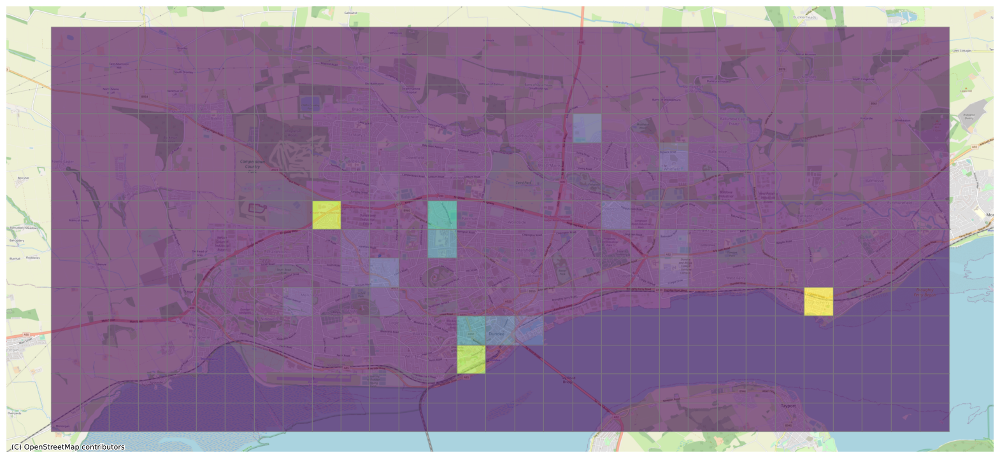

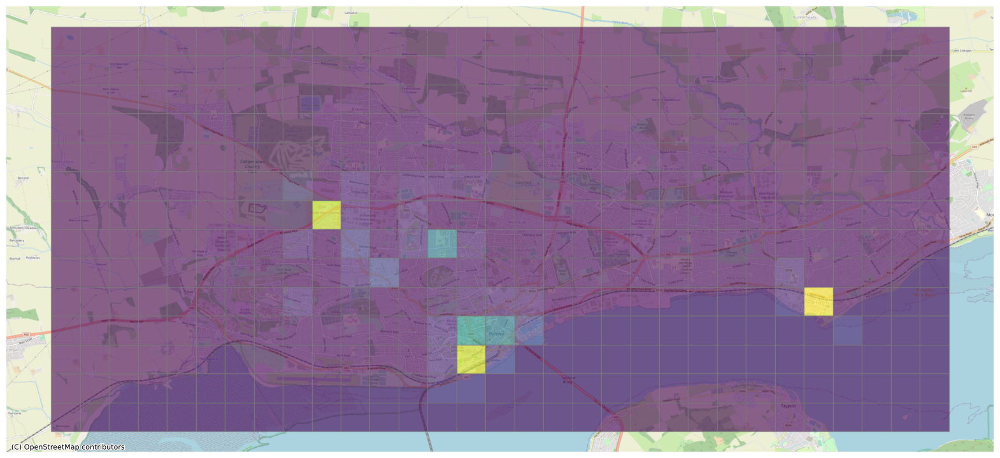

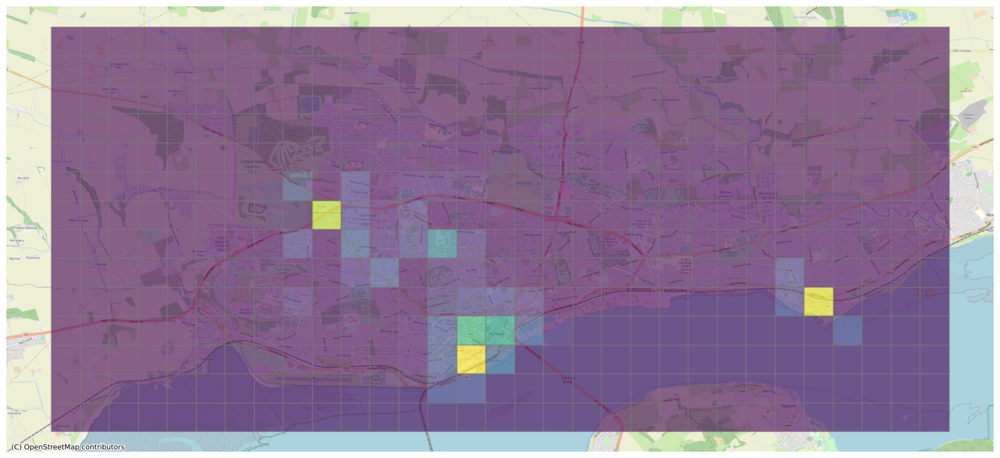

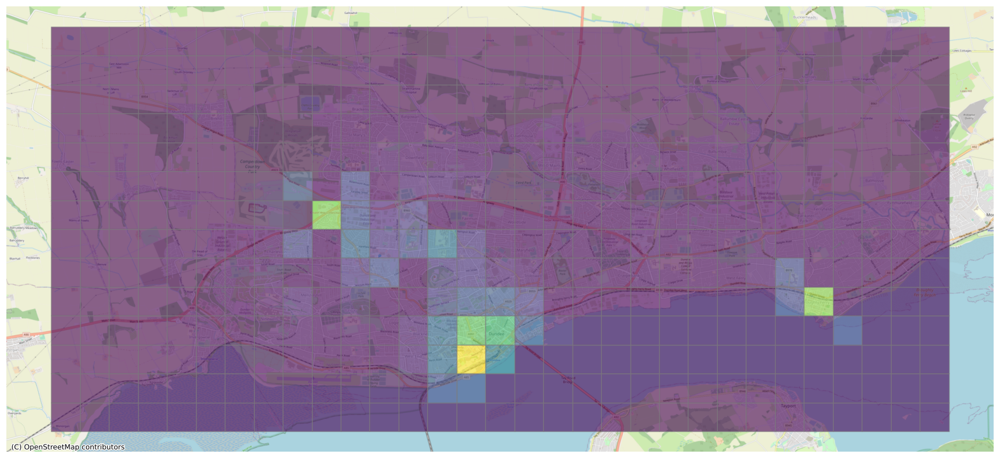

In [6]:
for t in range(4):
    axes = gdf.plot(figsize=(20,20),column=f'Demand_{t}',cmap='viridis',edgecolor='grey',alpha=0.6)
    ctx.add_basemap(axes,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    axes.axis('off')

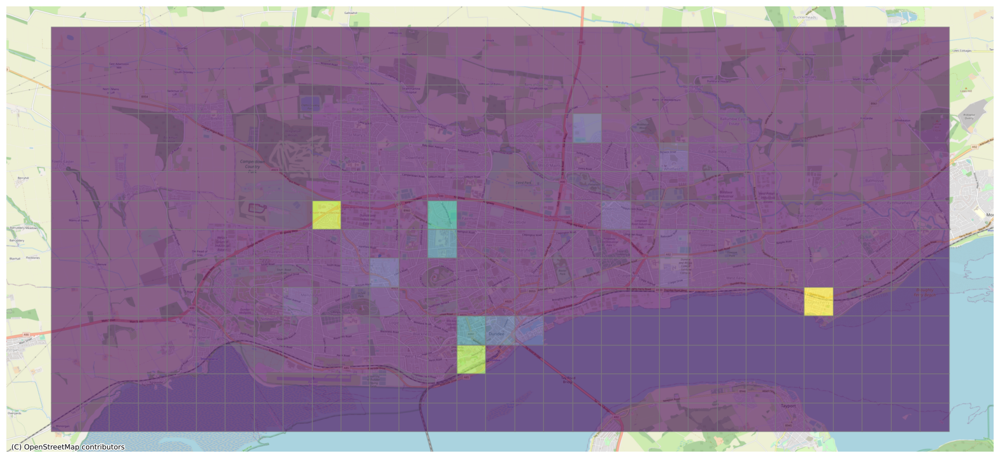

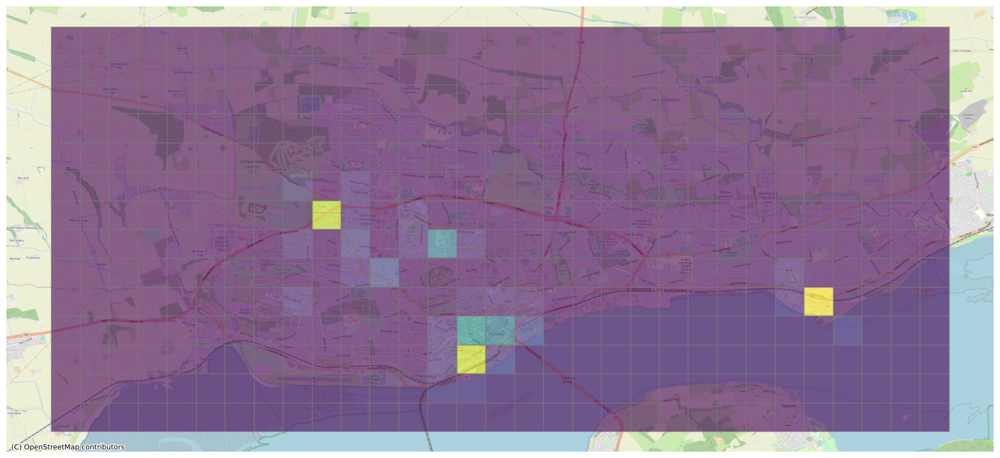

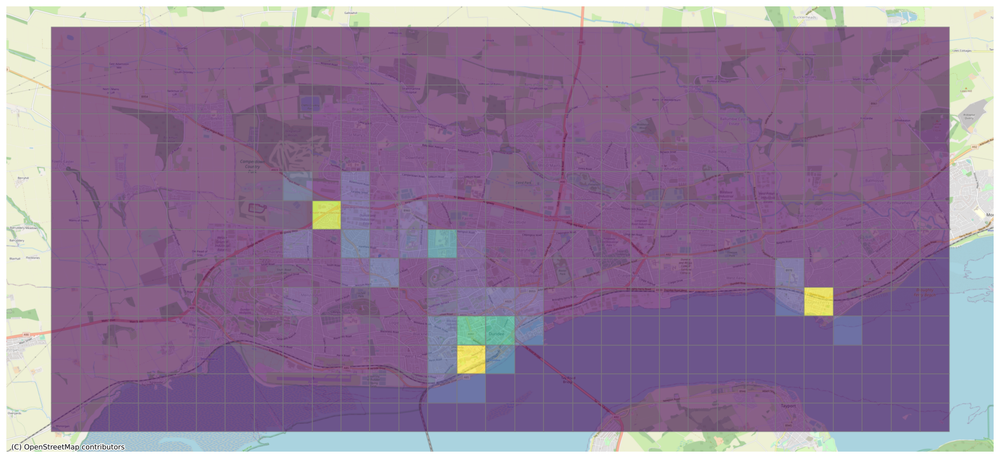

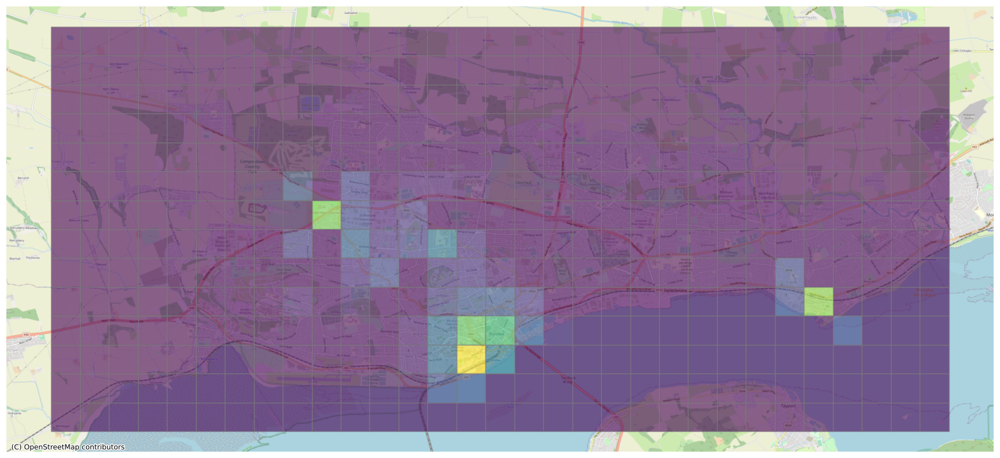

In [7]:
for t in range(4):
    axes = gdf.plot(figsize=(20,20),column=f'Supply_{t}',cmap='viridis',edgecolor='grey',alpha=0.6)
    ctx.add_basemap(axes,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    axes.axis('off')

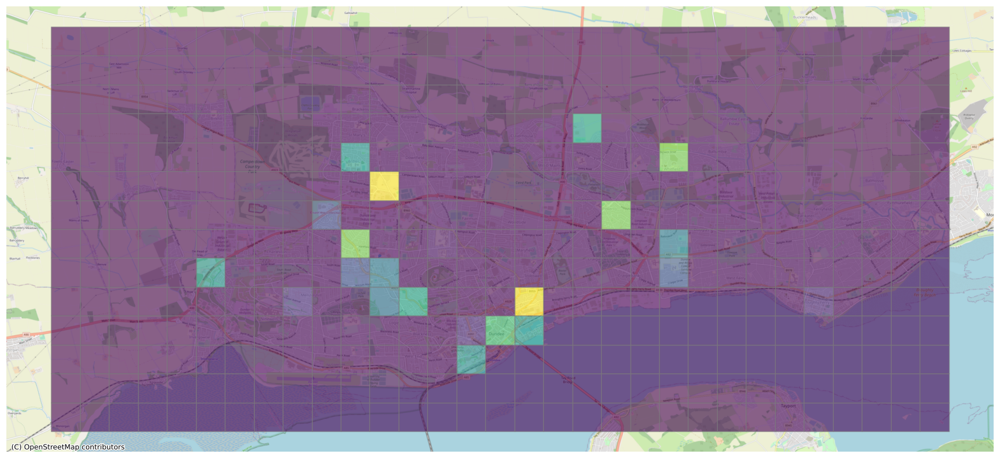

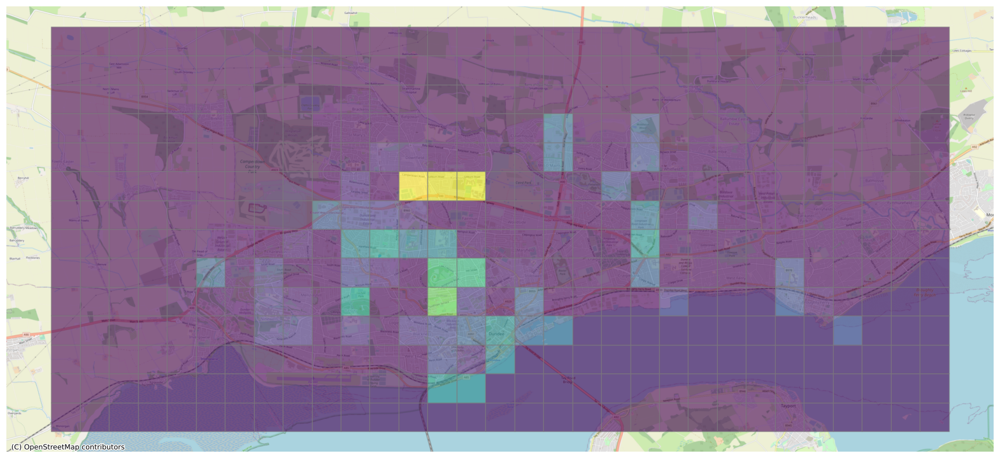

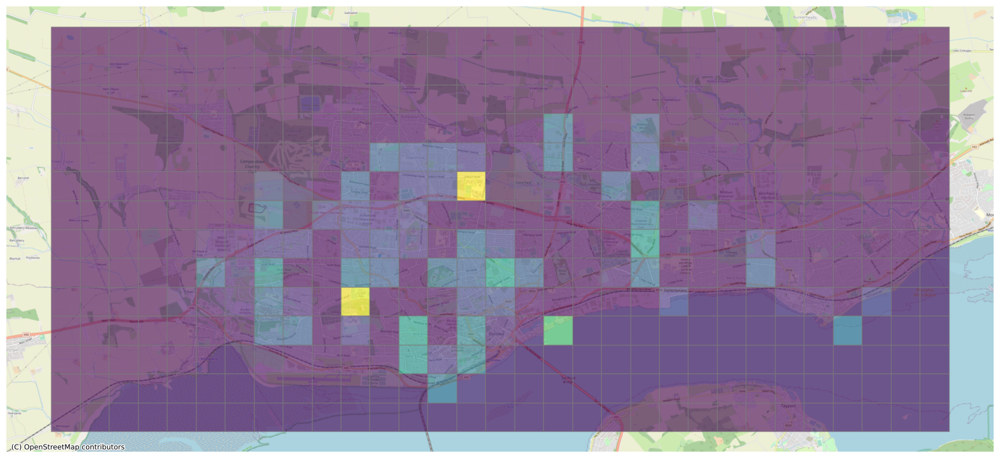

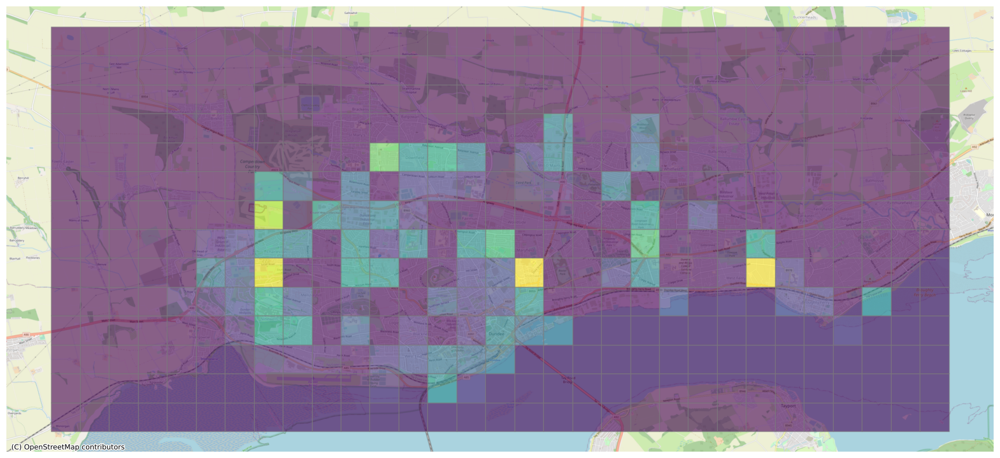

In [8]:
for t in range(4):
    axes = gdf.plot(figsize=(20,20),column=f'Diff_{t}',cmap='viridis',edgecolor='grey',alpha=0.6)
    ctx.add_basemap(axes,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    axes.axis('off')